In [ ]:
import numpy
import os
import cv2
import time
import pandas
import matplotlib.pyplot
from PIL import Image
from tensorflow import keras
import tensorflow
from tensorflow import keras
from tensorflow.keras import layers
# from tensorflow.keras import layers
from tensorflow.keras import models
from sklearn.model_selection import train_test_split
from scipy.stats import linregress


In [ ]:

#non_noise
from sklearn.cluster import DBSCAN

width = 1640
height = 590

Xtrain =[]
Ytrain = []
TRAIN_DATA = 'lane/wrong'

def DocDuLieu(file):
    DuLieu = []
    Label = []
    label = ''
    for file_path in os.listdir(file):
        file_path = os.path.join(file, file_path)
        list_filename_path = []
        label = file_path
        for filename in os.listdir(file_path):
            if (".jpg" in filename or ".png" in filename):
                filename_path = os.path.join(file_path, filename)
                img = numpy.array(Image.open(filename_path))
                img = cv2.resize(img, (width, height))
                list_filename_path.append(img)
                # Label.append(dict[(label)])
        DuLieu.extend(list_filename_path)
    return DuLieu, Label

def image_canny(lane_image):
    image_gray = cv2.cvtColor(lane_image, cv2.COLOR_RGB2GRAY)
    # image_gray_blur = cv2.GaussianBlur(image_gray, (7, 7), 2)
    image_gray_blur = cv2.GaussianBlur(src=image_gray, ksize=(5, 5), sigmaX=0, sigmaY=0)
    # image_gray_blur = cv2.medianBlur(src=image_gray, ksize=3)
    image_gray_blur_canny = cv2.Canny(image_gray_blur, 50, 150)
    return image_gray_blur_canny

def regon_of_interest(image):
    polygons = numpy.array([[(535, 415), (1185, 415), (822, 280), (788, 280)]])
    mask = numpy.zeros_like(image)
    cv2.fillPoly(mask, polygons, 255)
    mask_canny = cv2.bitwise_and(image, mask)
    return mask_canny

def display_lines(image, lines):
    line_image = numpy.zeros_like(image)
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line.reshape(4)
            cv2.line(line_image, (x1, y1), (x2, y2), (255, 255, 255), 2)
    return line_image

def make_coordinates(image, line_parameters, location):
    slope, intercept = line_parameters
    if location == 'right':
        y1 = 415
    else:
        y1 = 465
    y2 = 300
    x1 = int((y1 - intercept) / slope)
    x2 = int((y2 - intercept) / slope)
    return numpy.array([x1, y1, x2, y2])

#Hàm loại bỏ những điểm nhiễu
def non_noise(lines):
    data = []
    for line in lines:
            x1, y1, x2, y2 = line.reshape(4)
            data.append((x1, y1))
            data.append((x2, y2))
    data = numpy.array(data)
    eps = 60.0  # Độ lớn của cửa sổ
    min_samples = 2  # Số điểm tối thiểu trong mỗi cụm
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(data)

# Lấy các điểm không phải điểm nhiễu
    core_samples_mask = numpy.zeros_like(dbscan.labels_, dtype=bool)
    core_samples_mask[dbscan.core_sample_indices_] = True
    non_noise_points = data[core_samples_mask]
    if (len(non_noise_points) % 2 != 0):
        non_noise_points = non_noise_points[:-1]
        non_noise_points = non_noise_points.reshape((-1, 4))  
    non_noise_points = non_noise_points.reshape((-1, 4))
    return non_noise_points

def average_slope_intercept(image, lines):
    lines = non_noise(lines)
    left_fit = []
    right_fit = []
    for line in lines:
        x1, y1, x2, y2 = line.reshape(4)
        parameters = numpy.polyfit((x1, x2), (y1, y2), 1)
        slope = parameters[0]
        intercept = parameters[1]
        if slope < 0:
            left_fit.append((slope, intercept))
        else:
            right_fit.append((slope, intercept))
    left_fit_average = numpy.average(left_fit, axis=0)
    right_fit_average = numpy.average(right_fit, axis=0)
    try:    
        left_line = make_coordinates(image, left_fit_average, 'left')
        try:
            right_line = make_coordinates(image, right_fit_average, 'right')
        except Exception:
            return numpy.array([left_line, right_line])
    except Exception as e:
        try:
            right_line = make_coordinates(image, right_fit_average, 'right')
        except Exception as e:
            raise e
    return numpy.array([left_line, right_line])

def crop_output(image):
    image = image[240:400, 450:1250]
    image = cv2.resize(image, (160, 60))
    return image

Xtrain, Yrain = DocDuLieu(TRAIN_DATA)
# print(type(Xtrain[0]))

def lane_detection_image(image):
    lane_image = numpy.copy(image)
    canny = image_canny(lane_image) 
    regon = regon_of_interest(canny)
    lines = cv2.HoughLinesP(image=regon, rho=1, theta=numpy.pi/180, threshold=40, lines=numpy.array([]), minLineLength=5, maxLineGap=5)

    try:
        averaged_lines = average_slope_intercept(image, lines)
        lines = averaged_lines
    except Exception as e:
        # print('loi duong trung binh')
        raise e

    line_image = display_lines(lane_image, lines)
    combo_image = cv2.bitwise_and(image, line_image)
    combo_image =cv2.addWeighted(lane_image, 0.8, line_image, 1, 1)
    image_output = crop_output(line_image)
    # cv2.imwrite(filename='data/lane/acc/right/ringhtline{}.jpg'.format(count), img=image_output)
    # matplotlib.pyplot.imshow(combo_image)
    # matplotlib.pyplot.show()
    
    matplotlib.pyplot.imshow(combo_image)
    matplotlib.pyplot.show()
    images = [image, canny, regon, line_image, combo_image, image_output]
    captions = ["Ảnh từ camera", "Trích xuất cạnh", "Lấy vùng cần thiết", "Vẽ làn đường", "Ảnh hoàn chỉnh", "Ảnh đầu vào huấn luyến"]
    fig, axes = matplotlib.pyplot.subplots(2, 3)
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i])
        ax.set_title(captions[i], fontsize=16) 
        ax.axis('off')
    matplotlib.pyplot.tight_layout()
    matplotlib.pyplot.show()

    return image_output


show_image = lane_detection_image(Xtrain[6])

matplotlib.pyplot.imshow(show_image)
count = 0
# for i in Xtrain:
#     try:
#         file = lane_detection_image(i)
#     except Exception as e:
#         print(count)
#         continue
#     count = count + 1
# print(len(Xtrain))


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

# Read in the image
# image = mpimg.imread('D:\OneDrive - The University of Technology\tailieu\Nam3\ky2\pbl\LaneSenseGuard\lane\right\00000.jpg')
image = mpimg.imread('lane/right/00000.jpg')
# Grab the x and y size and make a copy of the image
ysize = image.shape[0]
xsize = image.shape[1]
color_select = np.copy(image)
line_image = np.copy(image)

# Define color selection criteria
# MODIFY THESE VARIABLES TO MAKE YOUR COLOR SELECTION
red_threshold = 200
green_threshold = 200
blue_threshold = 200

rgb_threshold = [red_threshold, green_threshold, blue_threshold]

# Define the vertices of a triangular mask.
# Keep in mind the origin (x=0, y=0) is in the upper left
# MODIFY THESE VALUES TO ISOLATE THE REGION 
# WHERE THE LANE LINES ARE IN THE IMAGE
left_bottom = [450, 539]
right_bottom = [1200, 539]
apex = [800, 290]

# Perform a linear fit (y=Ax+B) to each of the three sides of the triangle
# np.polyfit returns the coefficients [A, B] of the fit
fit_left = np.polyfit((left_bottom[0], apex[0]), (left_bottom[1], apex[1]), 1)
fit_right = np.polyfit((right_bottom[0], apex[0]), (right_bottom[1], apex[1]), 1)
fit_bottom = np.polyfit((left_bottom[0], right_bottom[0]), (left_bottom[1], right_bottom[1]), 1)

# Mask pixels below the threshold
color_thresholds = (image[:,:,0] < rgb_threshold[0]) | \
                    (image[:,:,1] < rgb_threshold[1]) | \
                    (image[:,:,2] < rgb_threshold[2])

# Find the region inside the lines
XX, YY = np.meshgrid(np.arange(0, xsize), np.arange(0, ysize))
region_thresholds = (YY > (XX*fit_left[0] + fit_left[1])) & \
                    (YY > (XX*fit_right[0] + fit_right[1])) & \
                    (YY < (XX*fit_bottom[0] + fit_bottom[1]))
                    
# Mask color and region selection
color_select[color_thresholds | ~region_thresholds] = [0, 0, 0]
# Color pixels red where both color and region selections met
line_image[~color_thresholds & region_thresholds] = [9, 255, 0]

# Display the image and show region and color selections
plt.imshow(image)
x = [left_bottom[0], right_bottom[0], apex[0], left_bottom[0]]
y = [left_bottom[1], right_bottom[1], apex[1], left_bottom[1]]
plt.plot(x, y, 'r--', lw=4)
plt.title("Region Of Interest")
plt.show()
plt.imshow(color_select)
plt.title("Color Selection in the Triangular Region")
plt.show()
plt.imshow(line_image)
plt.title("Region Masked Image [Lane Lines in Green]")
plt.show()

In [ ]:
# Do all the relevant imports
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2

# Read in the image and convert to grayscale
# Note: in the previous example we were reading a .jpg 
# Here we read a .png and convert to 0,255 bytescale
image = mpimg.imread('lane/right/3 (1).jpg')
gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)

# Define a kernel size for Gaussian smoothing / blurring
kernel_size = 5 # Must be an odd number (3, 5, 7...)
blur_gray = cv2.GaussianBlur(gray,(kernel_size, kernel_size),0)

# Define our parameters for Canny and run it
low_threshold = 180
high_threshold = 240
edges = cv2.Canny(blur_gray, low_threshold, high_threshold)

# Display the image
plt.imshow(edges, cmap='Greys_r')
plt.title("Canny Edge Detection Image")
plt.show()

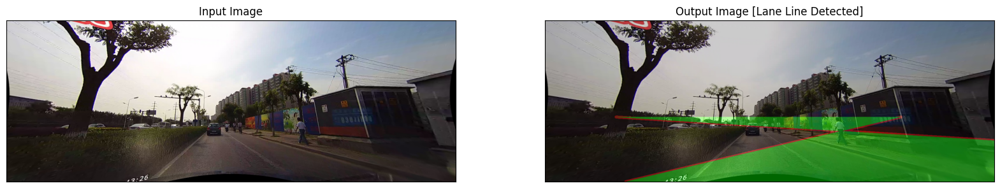

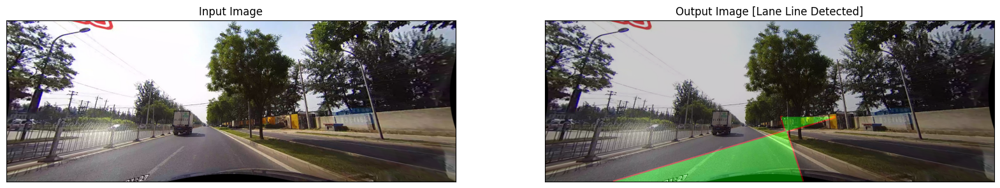

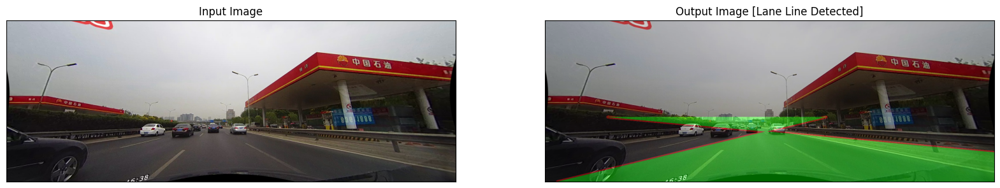

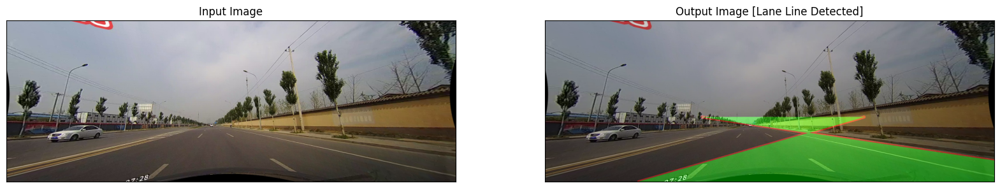

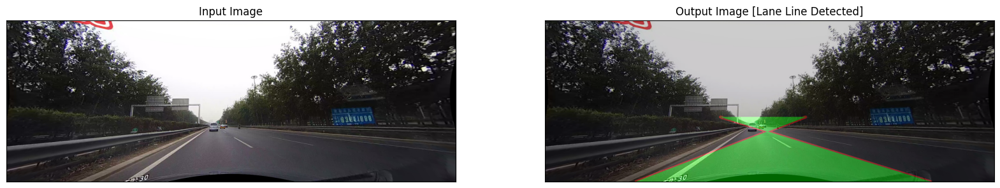

...

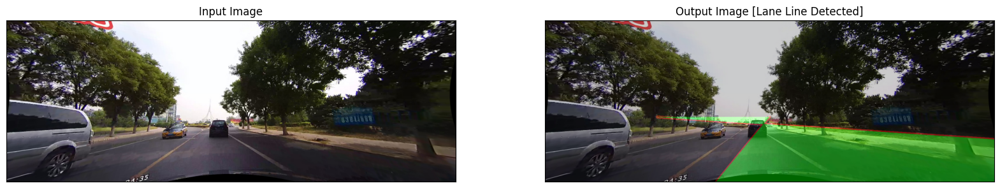

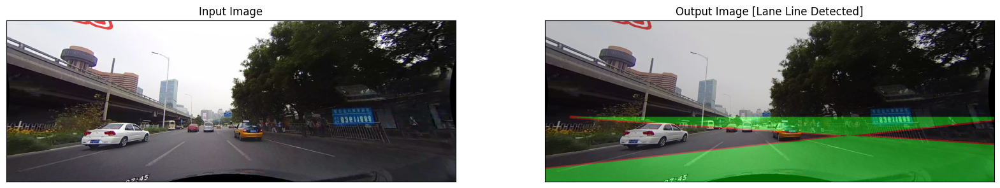

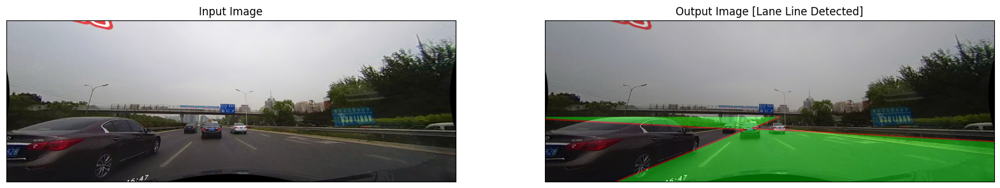

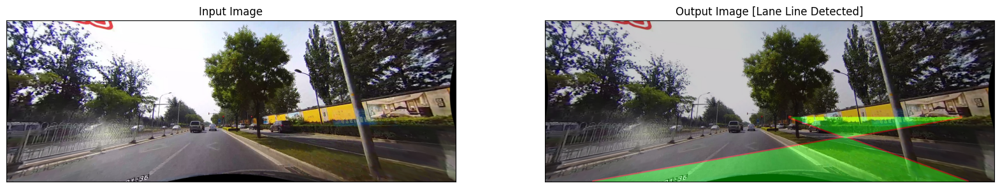

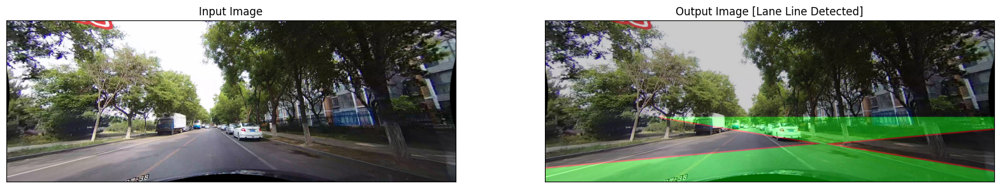

KeyboardInterrupt: 

In [42]:
import math

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def draw_lines(img, lines, color=[255, 0, 0], thickness=10):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(img, (x1, y1), (x2, y2), color, thickness)

def slope_lines(image,lines):
    
    img = image.copy()
    poly_vertices = []
    order = [0,1,3,2]

    left_lines = [] # Like /
    right_lines = [] # Like \
    for line in lines:
        for x1,y1,x2,y2 in line:

            if x1 == x2:
                pass #Vertical Lines
            else:
                m = (y2 - y1) / (x2 - x1)
                c = y1 - m * x1

                if m < 0:
                    left_lines.append((m,c))
                elif m >= 0:
                    right_lines.append((m,c))

    left_line = np.mean(left_lines, axis=0)
    right_line = np.mean(right_lines, axis=0)

    #print(left_line, right_line)

    for slope, intercept in [left_line, right_line]:

        #getting complete height of image in y1
        rows, cols = image.shape[:2]
        y1= int(rows) #image.shape[0]

        #taking y2 upto 60% of actual height or 60% of y1
        y2= int(rows*0.6) #int(0.6*y1)

        #we know that equation of line is y=mx +c so we can write it x=(y-c)/m
        x1=int((y1-intercept)/slope)
        x2=int((y2-intercept)/slope)
        poly_vertices.append((x1, y1))
        poly_vertices.append((x2, y2))
        draw_lines(img, np.array([[[x1,y1,x2,y2]]]))
    
    poly_vertices = [poly_vertices[i] for i in order]
    cv2.fillPoly(img, pts = np.array([poly_vertices],'int32'), color = (0,255,0))
    return cv2.addWeighted(image,0.7,img,0.4,0.)
    
    #cv2.polylines(img,np.array([poly_vertices],'int32'), True, (0,0,255), 10)
    #print(poly_vertices)

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    #draw_lines(line_img, lines)
    line_img = slope_lines(line_img,lines)
    return line_img

# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=0.1, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    lines_edges = cv2.addWeighted(initial_img, α, img, β, γ)
    #lines_edges = cv2.polylines(lines_edges,get_vertices(img), True, (0,0,255), 10)
    return lines_edges
def get_vertices(image):
    rows, cols = image.shape[:2]
    bottom_left  = [cols*0.15, rows]
    top_left     = [cols*0.45, rows*0.6]
    bottom_right = [cols*0.95, rows]
    top_right    = [cols*0.55, rows*0.6] 
    
    ver = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    # ver = np.array([[(450,550),(700, 400), (800, 400), (1300,550)]], dtype=np.int32)
    return ver

# Lane finding Pipeline
def lane_finding_pipeline(image):
    
    #Grayscale
    gray_img = grayscale(image)
    #Gaussian Smoothing
    smoothed_img = gaussian_blur(img = gray_img, kernel_size = 5)
    #Canny Edge Detection
    canny_img = canny(img = smoothed_img, low_threshold = 180, high_threshold = 240)
    #Masked Image Within a Polygon
    masked_img = region_of_interest(img = canny_img, vertices = get_vertices(image))
    #Hough Transform Lines
    houghed_lines = hough_lines(img = masked_img, rho = 1, theta = np.pi/180, threshold = 20, min_line_len = 20, max_line_gap = 180)
    #Draw lines on edges
    output = weighted_img(img = houghed_lines, initial_img = image, α=0.8, β=1., γ=0.)
    
    return output

for image_path in list(os.listdir('./lane/right')):
    fig = plt.figure(figsize=(20, 10))
    image = mpimg.imread(f'./lane/right/{image_path}')
    ax = fig.add_subplot(1, 2, 1,xticks=[], yticks=[])
    plt.imshow(image)
    ax.set_title("Input Image")
    ax = fig.add_subplot(1, 2, 2,xticks=[], yticks=[])
    plt.imshow(lane_finding_pipeline(image))
    ax.set_title("Output Image [Lane Line Detected]")
    plt.show()

In [ ]:
# Read in and grayscale the image
image = mpimg.imread('lane/right/01620.jpg')
gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)

# Define a kernel size and apply Gaussian smoothing
kernel_size = 5
blur_gray = cv2.GaussianBlur(gray,(kernel_size, kernel_size),0)

# Define our parameters for Canny and apply
low_threshold = 180
high_threshold = 240
edges = cv2.Canny(blur_gray, low_threshold, high_threshold)

# Next we'll create a masked edges image using cv2.fillPoly()
mask = np.zeros_like(edges)   
ignore_mask_color = 255   

# This time we are defining a four sided polygon to mask
imshape = image.shape
vertices = np.array([[(450,550),(700, 400), (800, 400), (1300,550)]], dtype=np.int32)
cv2.fillPoly(mask, vertices, ignore_mask_color)
masked_edges = cv2.bitwise_and(edges, mask)

# Define the Hough transform parameters
# Make a blank the same size as our image to draw on
rho = 1 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
threshold = 2     # minimum number of votes (intersections in Hough grid cell)
min_line_length = 4 #minimum number of pixels making up a line
max_line_gap = 5    # maximum gap in pixels between connectable line segments
line_image = np.copy(image)*0 # creating a blank to draw lines on

# Run Hough on edge detected image
# Output "lines" is an array containing endpoints of detected line segments
lines = cv2.HoughLinesP(masked_edges, rho, theta, threshold, np.array([]),
                            min_line_length, max_line_gap)

# Iterate over the output "lines" and draw lines on a blank image
for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),10)

# Create a "color" binary image to combine with line image
color_edges = np.dstack((edges, edges, edges)) 

# Draw the lines on the edge image
lines_edges = cv2.addWeighted(color_edges, 0.8, line_image, 1, 0)
lines_edges = cv2.polylines(lines_edges,vertices, True, (0,0,255), 10)
plt.imshow(image)
plt.title("Input Image")
plt.show()
plt.imshow(lines_edges)
plt.title("Colored Lane line [In RED] and Region of Interest [In Blue]")
plt.show()